# Analysis of Performance of Orbits Module

Author: Mariannly Marquez

## Index

1. [Module's Structure](#module-structure)
2. [Analysis of Performance](#module-performance)

    i. [Classical vs Relativistic Slope Functions](#Slopes)

    ii. [Effects of Eccentricity](#eccentricity)

    iii. [Method's Numerical convergence](#convergence)

## Module's Structure <a name="module-structure"></a>

`Orbits` is a two-body simulation package for classical and relativistic orbital motion around a black hole. This package provides tools to simulate and visualize the motion of a planet
orbiting a black hole using both classical Newtonian mechanics and relativistic corrections.

Classes:

`TwoBodySystem`: Handles the physical parameters and initial conditions.

`SimulationRunner`: Manages the numerical integration of the orbital motion.

`OrbitalAnimator`: Creates animations of the orbital motion.

Functions:

`classical_slope`: Computes the classical gravitational acceleration.

`relativistic_slope`: Computes the relativistic gravitational acceleration.

The structure of the module is as follows:

```
📦 orbitsmodule/
├── 🌀 orbits/                      # Core simulation package
│   ├── 📄 __init__.py
│   ├── 📄 orbits.py                # Contains main classes & slope functions
├── 📊 analysis/                    # Notebooks and output analysis
│   ├── 📓 analysis.ipynb
│   ├── 📁 outputfolder/            #  Animations and orbit histories
│   │   └── 💾 (saved output files)
├── 🧪 tests/                       # Unit tests
│   └── 🧪 test_orbits.py
├── 📘 README.md                    # Documentation
├── ⚙️ setup.py                     # Package installer
```



## Analysis of Performance <a name="module-performance"></a>


In [1]:
import sys
from pathlib import Path

# Add the parent directory of analysis folder to the module search path
root_path = Path().resolve().parent
if str(root_path) not in sys.path:
    sys.path.append(str(root_path))

In [2]:
from orbits.orbits import TwoBodySystem, SimulationRunner, OrbitalAnimator
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image
import pandas as pd

### Classical vs Relativistic Slope Functions <a name="Slopes"></a>


(i) Use your module/script to run and show two simulations: one relativistic and one classical for this set of initial conditions. It may be helpful to compare the orbital history in a single plot.

| Parameter | Description                                       | Units      |
|-----------|---------------------------------------------------|------------|
| $e$       | Eccentricity of the orbit                         | $0$        |
| $M$       | Mass of the central black hole                    | $5\times 10^6\,\rm M_\odot$ |
| $a$       | Semi-major axis of the orbit                      | $1\,\rm AU$|
| $N$       | Number of orbital periods to simulate             | $2$        |
| Method    | Numerical method for ODE integration              | RK3        |


In [3]:
# Classical simulation
system_classical = TwoBodySystem(a=1, e=0, M=5e6, N=2, method_name="rk3",slope_type="classical")
simulation_classical = SimulationRunner(method_name="rk3", 
                                      slope_type="classical", 
                                      dt=1e-5, 
                                      system=system_classical)
simulation_classical.run()
animator_classical = OrbitalAnimator(method_name="rk3", 
                                   slope_type="classical", 
                                   dt=1e-5, 
                                   system=system_classical)
animator_classical.create_gif()

# Relativistic simulation
system_relativistic = TwoBodySystem(a=1, e=0, M=5e6, N=2, method_name="rk3",slope_type="relativistic")
simulation_relativistic = SimulationRunner(method_name="rk3", 
                                         slope_type="relativistic", 
                                         dt=1e-5, 
                                         system=system_relativistic)
simulation_relativistic.run()
animator_relativistic = OrbitalAnimator(method_name="rk3", 
                                      slope_type="relativistic", 
                                      dt=1e-5, 
                                      system=system_relativistic)
animator_relativistic.create_gif()  

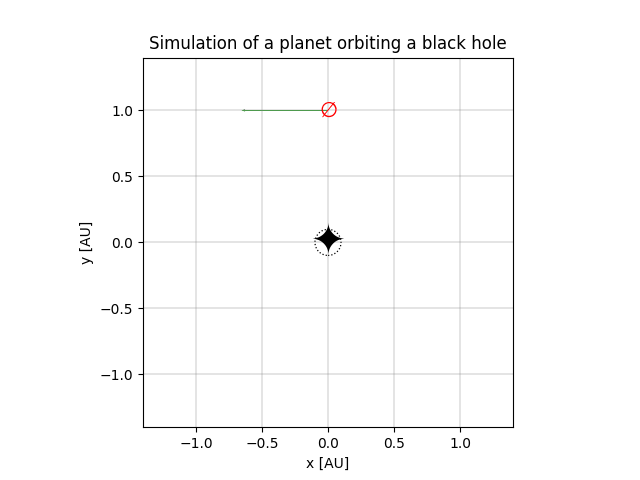

In [4]:
# Showing the animations by reading the gif files
file_path_classical = Path("outputfolder/orbit_a{:.0f}_e{:.2f}_M{:-.0E}_{}_{}.gif".format(system_classical.a, system_classical.e, system_classical.M, system_classical.method_name, system_classical.slope_type))
Image(filename=file_path_classical)


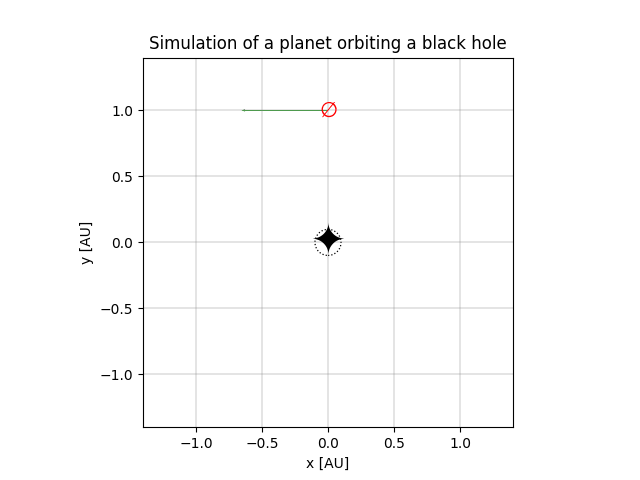

In [5]:
# Showing the animations by reading the gif files
file_path_relativistic = Path("outputfolder/orbit_a{:.0f}_e{:.2f}_M{:-.0E}_{}_{}.gif".format(system_relativistic.a, system_relativistic.e, system_relativistic.M, system_relativistic.method_name, system_relativistic.slope_type))
Image(filename=file_path_relativistic)

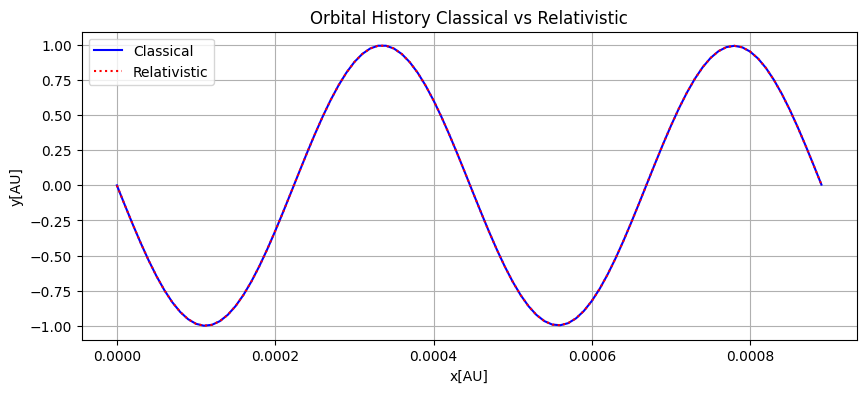

In [6]:
# Plotting the orbital history in a single plot
data_classical = pd.read_csv("outputfolder/orbit_data_a{:.0f}_e{:.2f}_M{:-.0E}_{}_{}.csv".format(system_classical.a, system_classical.e, system_classical.M, system_classical.method_name, system_classical.slope_type))
data_relativistic = pd.read_csv("outputfolder/orbit_data_a{:.0f}_e{:.2f}_M{:-.0E}_{}_{}.csv".format(system_relativistic.a, system_relativistic.e, system_relativistic.M, system_relativistic.method_name, system_relativistic.slope_type))


fig, ax = plt.subplots(figsize=(10, 4))

ax.plot(data_classical['t'], data_classical['x'], label="Classical", color='blue')
ax.plot(data_relativistic['t'], data_relativistic['x'], label="Relativistic", color='red', linestyle=':')

ax.set_xlabel("x[AU]")
ax.set_ylabel("y[AU]")
ax.set_title("Orbital History Classical vs Relativistic")
ax.legend()
plt.grid()
plt.show()


I do not notice a big difference between the two simulations. This might be due to the visualization method. Let's compute the actual difference between the two simulations. We can do this by computing the difference between the two trayectories at each time step. This will give us a measure of how much the two simulations diverge from each other.


(j) Use the orbital history of both simulations to design a method that quantifies their differences and evaluates the importance of using the relativistic approach for massive objects. Do we need to worry about the relativistic corrections if we replace the black hole with our Sun?

In [7]:
def orbit_comparison(data_classical, data_relativistic, x_axis='t', title='Classical vs Relativistic'):
    """
    Compare the classical and relativistic simulations by computing the difference in their trajectories.
    """
    # Compute the difference in trajectories
    diff_x = data_classical['x'] - data_relativistic['x']
    diff_y = data_classical['y'] - data_relativistic['y']
    diff_r = np.sqrt(diff_x**2 + diff_y**2)

    # Plot the differences
    fig, ax = plt.subplots(figsize=(10, 4))
    ax.plot(data_classical[x_axis], diff_r, label="Difference", color='green')
    ax.set_xlabel("{}".format(x_axis))
    ax.set_ylabel("Difference in Trajectory [AU]")
    ax.set_title("Difference in Trajectories: {}".format(title))
    ax.legend()
    plt.grid()
    plt.show()

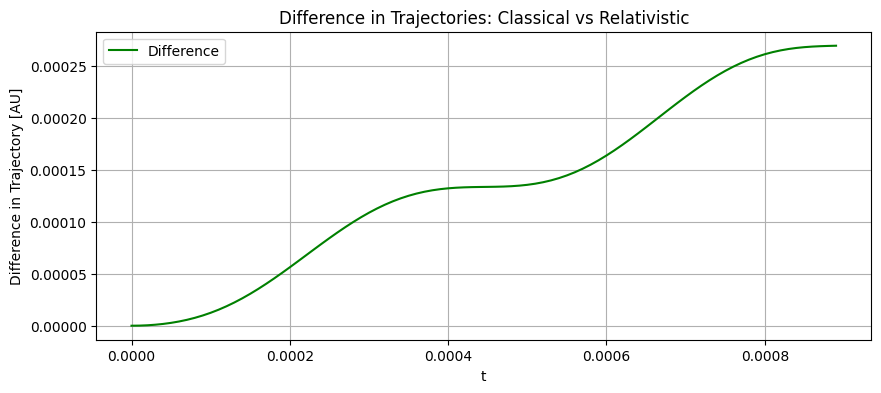

In [8]:
orbit_comparison(data_classical, data_relativistic)

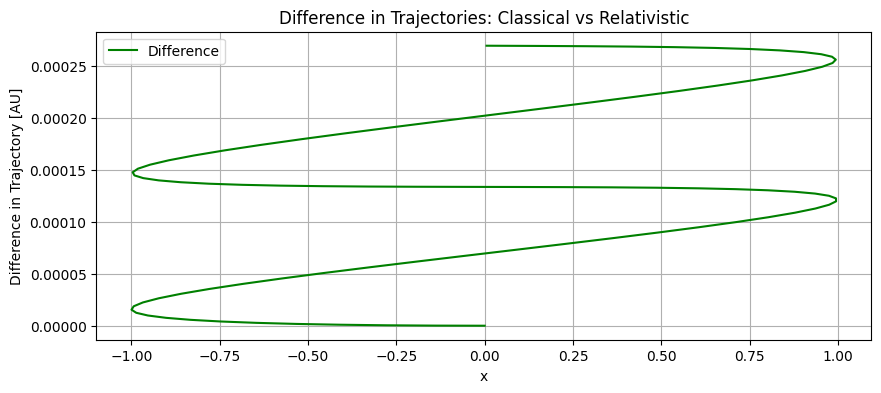

In [9]:
orbit_comparison(data_classical, data_relativistic, x_axis='x')

In this two plots we can actually observe more clearly the differences between the two simulations. The differences are more pronounced as time grows. This might be because the relativistic effects are stronger at the periapsis of the orbit, driving the difference higher each time it completes an orbit.

### Effects of Eccentricity <a name="eccentricity"></a>


(k) Use your module/script to run and show three relativistic simulations for objects with different eccentricities, $e$, and assuming the same $M$, $a$, $N$ as above. It may be helpful to compare the orbital history for all values of $e$ in a single plot throughout time.

| Object           | Eccentricity ($e$) | Integration Method |
|------------------|--------------------|--------------------|
| Earth            | 0.01671            | Trapezoidal        |
| Pluto            | 0.25               | Trapezoidal        |
| 7092 Cadmus      | 0.70               | Trapezoidal        |


In [10]:
# Earth simulation
system_earth = TwoBodySystem(a=1, e=0.01671, M=5e6, N=2, method_name="trapezoidal",slope_type="relativistic")
simulation_earth = SimulationRunner(method_name="trapezoidal", 
                                      slope_type="relativistic", 
                                      dt=1e-6, 
                                      system=system_earth)
simulation_earth.run()
animator_earth = OrbitalAnimator(method_name="trapezoidal", 
                                   slope_type="relativistic", 
                                   dt=1e-6, 
                                   system=system_earth)
animator_earth.create_gif()


In [11]:
# Pluto simulation
system_pluto = TwoBodySystem(a=1, e=0.248, M=5e6, N=2, method_name="trapezoidal",slope_type="relativistic")
simulation_pluto = SimulationRunner(method_name="trapezoidal",
                                      slope_type="relativistic", 
                                      dt=1e-6, 
                                      system=system_pluto)
simulation_pluto.run()
animator_pluto = OrbitalAnimator(method_name="trapezoidal", 
                                   slope_type="relativistic", 
                                   dt=1e-6, 
                                   system=system_pluto)
animator_pluto.create_gif()


In [12]:
# 7092 Cadmus simulation
system_cadmus = TwoBodySystem(a=1, e=0.7, M=5e6, N=2, method_name="trapezoidal",slope_type="relativistic")
simulation_cadmus = SimulationRunner(method_name="trapezoidal",
                                      slope_type="relativistic", 
                                      dt=1e-6, 
                                      system=system_cadmus)
simulation_cadmus.run()
animator_cadmus = OrbitalAnimator(method_name="trapezoidal", 
                                   slope_type="relativistic", 
                                   dt=1e-6, 
                                   system=system_cadmus)
animator_cadmus.create_gif()

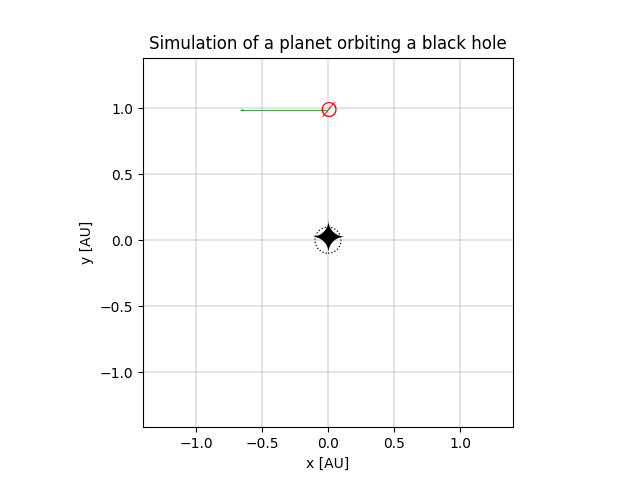

In [13]:
# Showing the animations 
file_path_earth = Path("outputfolder/orbit_a{:.0f}_e{:.2f}_M{:-.0E}_{}_{}.gif".format(system_earth.a, system_earth.e, system_earth.M, system_earth.method_name, system_earth.slope_type))
Image(filename=file_path_earth)

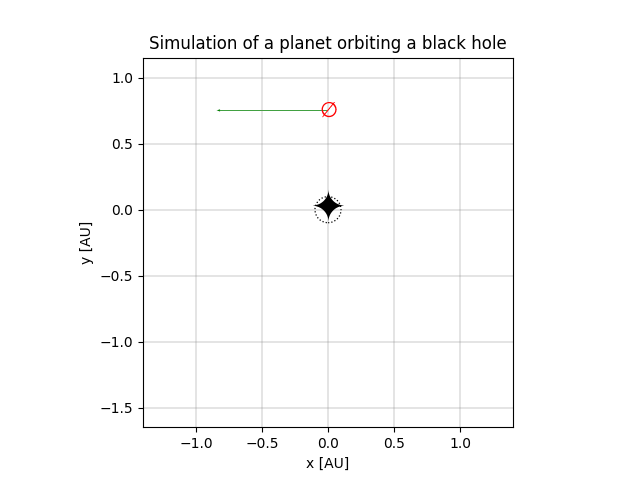

In [14]:
file_path_pluto = Path("outputfolder/orbit_a{:.0f}_e{:.2f}_M{:-.0E}_{}_{}.gif".format(system_pluto.a, system_pluto.e, system_pluto.M, system_pluto.method_name, system_pluto.slope_type))
Image(filename=file_path_pluto)

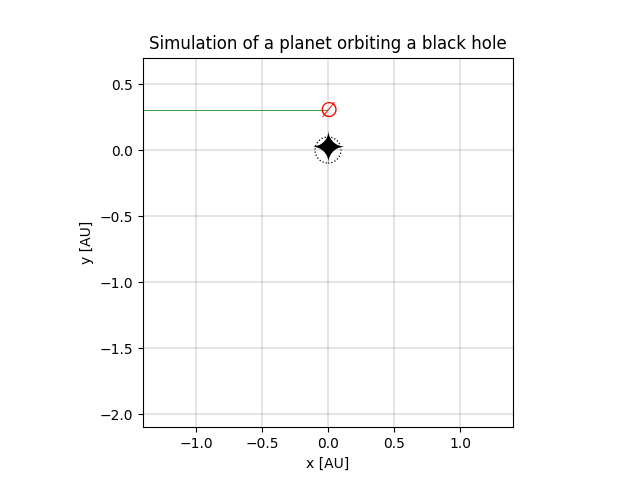

In [15]:
file_path_cadmus = Path("outputfolder/orbit_a{:.0f}_e{:.2f}_M{:-.0E}_{}_{}.gif".format(system_cadmus.a, system_cadmus.e, system_cadmus.M, system_cadmus.method_name, system_cadmus.slope_type))
Image(filename=file_path_cadmus)


(l) Describe the differences in the orbits of the above objects. What happens to objects with high eccentricities?

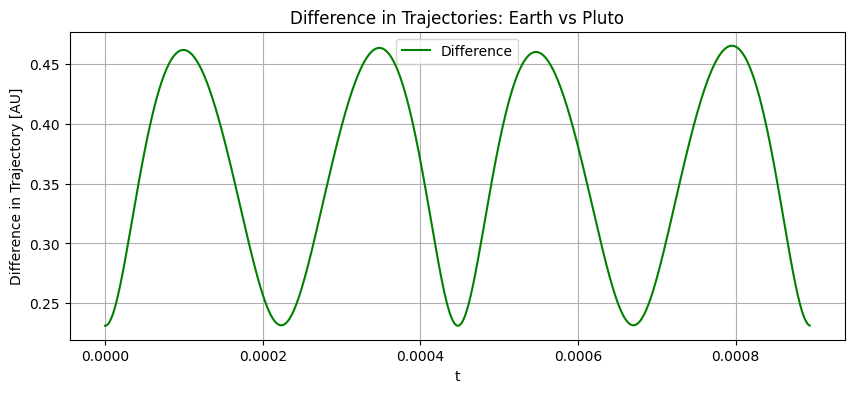

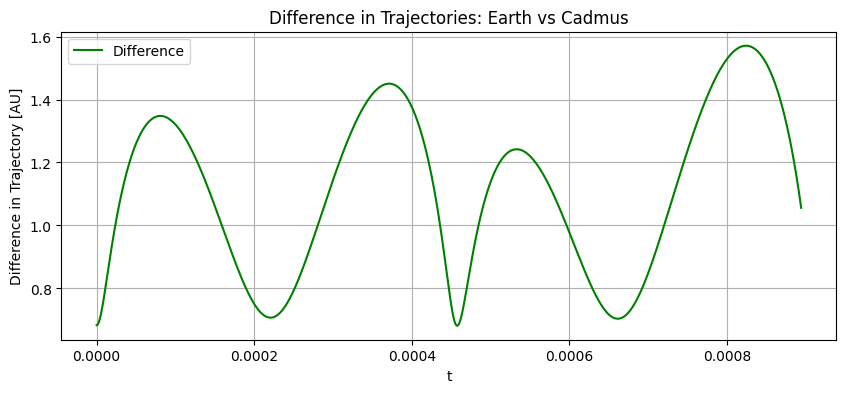

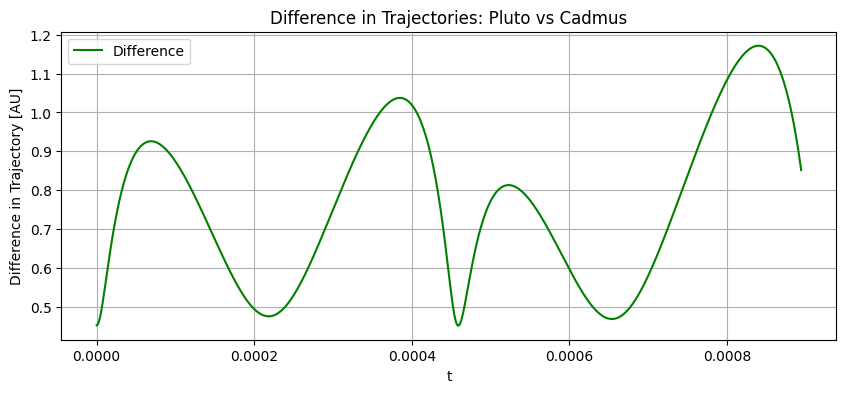

In [16]:
data_earth = pd.read_csv("outputfolder/orbit_data_a{:.0f}_e{:.2f}_M{:-.0E}_{}_{}.csv".format(system_earth.a, system_earth.e, system_earth.M, system_earth.method_name, system_earth.slope_type))
data_pluto = pd.read_csv("outputfolder/orbit_data_a{:.0f}_e{:.2f}_M{:-.0E}_{}_{}.csv".format(system_pluto.a, system_pluto.e, system_pluto.M, system_pluto.method_name, system_pluto.slope_type))
data_cadmus = pd.read_csv("outputfolder/orbit_data_a{:.0f}_e{:.2f}_M{:-.0E}_{}_{}.csv".format(system_cadmus.a, system_cadmus.e, system_cadmus.M, system_cadmus.method_name, system_cadmus.slope_type))


orbit_comparison(data_earth, data_pluto, title='Earth vs Pluto')
orbit_comparison(data_earth, data_cadmus, title='Earth vs Cadmus')
orbit_comparison(data_pluto, data_cadmus, title='Pluto vs Cadmus')

The orbits of the three objects are very different. The Earth has a very low eccentricity, which means that its orbit is almost circular. Pluto has a higher eccentricity, which means that its orbit is more elliptical. 7092 Cadmus has the highest eccentricity, which means that its orbit is very elongated and it spends most of its time far away from the black hole. This is because the gravitational force acting on it is weaker when it is far away from the Sun, allowing it to move faster and cover more distance in less time.

I think this was a good way to test the module. I noticed that for higher eccentricities, I needed to increase the dt or the methods would not preform as expected. However, with an appropiate dt, the module was able to simulate the Cadmus orbit without any problems. 



### Method's Numerical convergence <a name="convergence"></a>


(m) Use your script to generate additional simulations with the same initial conditions as before, but only for $e=0.01671$ (Earth's eccentricity) with RK3, the Trapezoidal method and the higher-order SciPy integrator. Compare the orbital history for all methods in a single plot throughout time.


In [17]:
# Trapezoidal simulation
system_trapezoidal = TwoBodySystem(a=1, e=0.01671, M=5e6, N=2, method_name="trapezoidal",slope_type="relativistic")
simulation_trapezoidal = SimulationRunner(method_name="trapezoidal", 
                                         slope_type="relativistic", 
                                         dt=1e-5, 
                                         system=system_trapezoidal)
simulation_trapezoidal.run()
animator_trapezoidal = OrbitalAnimator(method_name="trapezoidal", 
                                      slope_type="relativistic", 
                                      dt=1e-5, 
                                      system=system_trapezoidal)
animator_trapezoidal.create_gif()

# RK3 simulation
system_rk3 = TwoBodySystem(a=1, e=0.01671, M=5e6, N=2, method_name="rk3",slope_type="relativistic")
simulation_rk3 = SimulationRunner(method_name="rk3", 
                                      slope_type="relativistic", 
                                      dt=1e-5, 
                                      system=system_rk3)
simulation_rk3.run()
animator_rk3 = OrbitalAnimator(method_name="rk3", 
                                   slope_type="relativistic", 
                                   dt=1e-5, 
                                   system=system_rk3)
animator_rk3.create_gif()

# Scipy simulation
system_scipy = TwoBodySystem(a=1, e=0.01671, M=5e6, N=2, method_name="scipy",slope_type="relativistic")
simulation_scipy = SimulationRunner(method_name="scipy", 
                                      slope_type="relativistic", 
                                      dt=1e-5, 
                                      system=system_scipy)
simulation_scipy.run()
animator_scipy = OrbitalAnimator(method_name="scipy", 
                                   slope_type="relativistic", 
                                   dt=1e-5, 
                                   system=system_scipy)
animator_scipy.create_gif()


In [18]:
data_trapezoidal = pd.read_csv("outputfolder/orbit_data_a{:.0f}_e{:.2f}_M{:-.0E}_{}_{}.csv".format(system_trapezoidal.a, system_trapezoidal.e, system_trapezoidal.M, system_trapezoidal.method_name, system_trapezoidal.slope_type))
data_rk3 = pd.read_csv("outputfolder/orbit_data_a{:.0f}_e{:.2f}_M{:-.0E}_{}_{}.csv".format(system_rk3.a, system_rk3.e, system_rk3.M, system_rk3.method_name, system_rk3.slope_type))
data_scipy = pd.read_csv("outputfolder/orbit_data_a{:.0f}_e{:.2f}_M{:-.0E}_{}_{}.csv".format(system_scipy.a, system_scipy.e, system_scipy.M, system_scipy.method_name, system_scipy.slope_type))

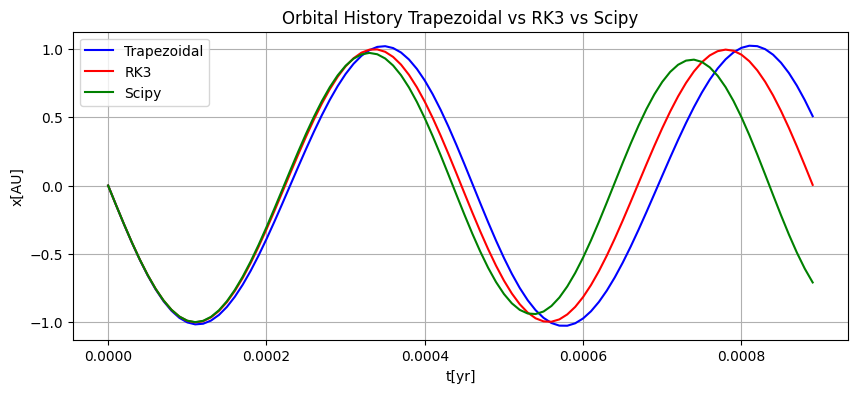

In [19]:
# Plotting

plt.figure(figsize=(10, 4))

plt.plot(data_trapezoidal['t'], data_trapezoidal['x'], label="Trapezoidal", color='blue')
plt.plot(data_rk3['t'], data_rk3['x'], label="RK3", color='red')
plt.plot(data_scipy['t'], data_scipy['x'], label="Scipy", color='green')

plt.xlabel("t[yr]")
plt.ylabel("x[AU]")
plt.title("Orbital History Trapezoidal vs RK3 vs Scipy")
plt.legend()
plt.grid()
plt.show()


We can see that the method behave very similarly during the first orbit. However, as time goes by, the RK3 and trapezoidal method diverges from the scipy method. The trapezoidal integrator having the greater difference. This is because the trapezoidal method is a second-order method, while RK3 is a third-order method.


(n) Measure convergence of the simulations with RK3 and Trapezoidal method for $e=0.01671$ by integrating at a number of different time steps. To analyse convergence, you need to define some measure for the error with respect to the higher order method, and then plot it against different time steps for both methods. Thus, you may add additional functions for this to your code in **orbits.py**. 
